# Mass flux impacts

In this notebook, we examine the impact of AMG-hijacked reactions on the mass flux through metabolic subsystems.

In [1]:
import cobra
import numpy as np
import matplotlib.pyplot as plt
import graph_utils as gu
from itertools import combinations_with_replacement
import json
from amg_utils import amg_limits, amg_impact_by_parsimony
from plotting_utils import draw_graph

In [2]:
masses = json.loads(open("model_files/masses.json").read())
manual_relabels = json.loads(open("model_files/subsystem_alias.json").read())
amgs = json.loads(open("model_files/amg_reactions.json").read())
amg_gene_names = json.loads(open("model_files/amg_gene_map.json").read())
amg_rxn_names = {k: f"{v}: {k}" for k, v in amg_gene_names.items()}

In [3]:
model = cobra.io.read_sbml_model("./model_files/ProchlorococcusMED4+PHM2v1.xml")

## Compute baseline fluxes

The `baseline` variable contains a flux distribution generated by parsimonious FBA. The implementation of pFBA in `cobra` does not distinguish between gene-regulated reactions and non-gene-regulated reactions. Our implementation in `amg_utils.amg_impact_by_parsimony` only applies a flux penalty to gene-regulated reactions.

In [4]:
baseline = amg_impact_by_parsimony(model, amgs, new_amg_penalty=0)

## Compute AMG target ranges

See `phage_biomass_impact.ipynb` for additional details on how the target ranges are defined.

In [5]:
amg_limits_dict = {}
with model as phm2:
    phm2.objective = phm2.reactions.PHM2_prodrxn_VN
    for amg, direction in amgs.items():
        amg_limits_dict[amg] = amg_limits(
            phm2, amg, direction, tol=0.1, optimum_fraction=0.5
        )

## Compute pair-wise mass flux difference graphs

For each pair of AMG reactions and for each individual AMG reaction, we restrict the flux(s) to the corresponding target range(s) and use MOMA (with linear distance) to compute a new flux distribution. From the new and baseline flux distributions, we compute a subsystem mass flux difference graph (MFD graph; see `graph_utils.py`). We plot the resulting MFD graphs when the new flux distribution is feasible, otherwise, we indicate infeasibility with a text label.

In [6]:
fig, axs = plt.subplots(len(amgs), len(amgs), figsize=(100, 100))
graphs = {}
for ax in axs.flatten():
    ax.xaxis.set_ticks_position("none")
    ax.yaxis.set_ticks_position("none")
    ax.xaxis.set_major_locator(plt.NullLocator())
    ax.yaxis.set_major_locator(plt.NullLocator())
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.spines["left"].set_visible(False)

for (i, amg1), (j, amg2) in combinations_with_replacement(
    enumerate(sorted(amgs, key=amg_rxn_names.get)), 2
):
    with model as smodel:
        ax = axs[i][j]

        smodel.reactions.get_by_id(amg1).bounds = amg_limits_dict[amg1]
        smodel.reactions.get_by_id(amg2).bounds = amg_limits_dict[amg2]
        smoma = cobra.flux_analysis.moma(smodel, baseline)

        ax.xaxis.set_ticks_position("none")
        ax.yaxis.set_ticks_position("none")
        ax.xaxis.set_major_locator(plt.NullLocator())
        ax.yaxis.set_major_locator(plt.NullLocator())

        if smoma.status == "optimal":
            go = gu.subsystem_flux_graph(smodel, baseline.fluxes, masses=masses)
            gp = gu.subsystem_flux_graph(smodel, smoma.fluxes, masses=masses)
            gd = gu.diff_graph(gp, go)
            graphs[(amg1, amg2)] = (gp, go, gd)
            draw_graph(gd, ax, cut=30 / 300, manual_relabels=manual_relabels, scale=300)
        else:
            ax.annotate(
                "Infeasible",
                xy=(0.5, 0.5),
                xytext=(0.5, 0.5),
                fontsize=32,
                horizontalalignment="center",
                verticalalignment="center",
            )
        if i != j:
            ax.set_title(f"{amg_rxn_names[amg1]}\n{amg_rxn_names[amg2]}", fontsize=16)
        else:
            ax.set_title(f"{amg_rxn_names[amg1]}", fontsize=16)
        print(amg_rxn_names[amg1], amg_rxn_names[amg2], smoma.status)
plt.show()

cobS: R05223 cobS: R05223 optimal
cobS: R05223 cp12: R01063 optimal
cobS: R05223 cp12: R01523 optimal
cobS: R05223 cpeT/cpcT: R05818 optimal
cobS: R05223 ho1: R00311 optimal
cobS: R05223 mazG: R00426 optimal
cobS: R05223 mazG: R00662 optimal
cobS: R05223 mazG: R01855 optimal
cobS: R05223 mazG: R02100 optimal


c:\Users\rozu775\Documents\Code\nwbrave\hm2-amgs-in-med4\.venv\Lib\site-packages\cobra\util\solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


cobS: R05223 nrdA: R02017 infeasible
cobS: R05223 nrdA: R02018 optimal
cobS: R05223 nrdA: R02019 infeasible
cobS: R05223 nrdA: R02024 optimal
cobS: R05223 pebS: R05817 optimal
cobS: R05223 phoH: FAKEOrthophosphateEX optimal
cobS: R05223 psbA/psbD: PSIIabs optimal
cobS: R05223 talC: R01827 optimal
cp12: R01063 cp12: R01063 optimal
cp12: R01063 cp12: R01523 optimal
cp12: R01063 cpeT/cpcT: R05818 optimal
cp12: R01063 ho1: R00311 optimal
cp12: R01063 mazG: R00426 optimal
cp12: R01063 mazG: R00662 optimal
cp12: R01063 mazG: R01855 optimal
cp12: R01063 mazG: R02100 optimal
cp12: R01063 nrdA: R02017 optimal
cp12: R01063 nrdA: R02018 optimal
cp12: R01063 nrdA: R02019 optimal
cp12: R01063 nrdA: R02024 optimal
cp12: R01063 pebS: R05817 optimal
cp12: R01063 phoH: FAKEOrthophosphateEX optimal
cp12: R01063 psbA/psbD: PSIIabs optimal
cp12: R01063 talC: R01827 optimal
cp12: R01523 cp12: R01523 optimal
cp12: R01523 cpeT/cpcT: R05818 optimal
cp12: R01523 ho1: R00311 optimal
cp12: R01523 mazG: R00426 op

## Compute non-additivity

For each pair of AMG-hijacked reactions, we compare the MFD graph $G_1$ obtained for the pair of reactions to the edge-wise sum $G_2$ of MFD graphs for each reaction individually. We compute the RMSD of the edges between $G_1$ and $G_2$ and plot a heatmap of this value.

In [7]:
syn = {}
for (amg1, amg2), (gp, go, gd) in graphs.items():
    if amg1 == amg2:
        continue
    g1 = graphs[(amg1, amg1)][-1]
    g2 = graphs[(amg2, amg2)][-1]
    diff_from_additive = gu.diff_graph(gu.diff_graph(gd, g1), g2)

    msd = np.mean([d["weight"] ** 2 for _, _, d in diff_from_additive.edges(data=True)])
    # msd = np.mean(
    #     [diff_from_additive.in_degree(u) ** 2 for u in diff_from_additive.nodes()]
    # )
    syn[(amg1, amg2)] = msd

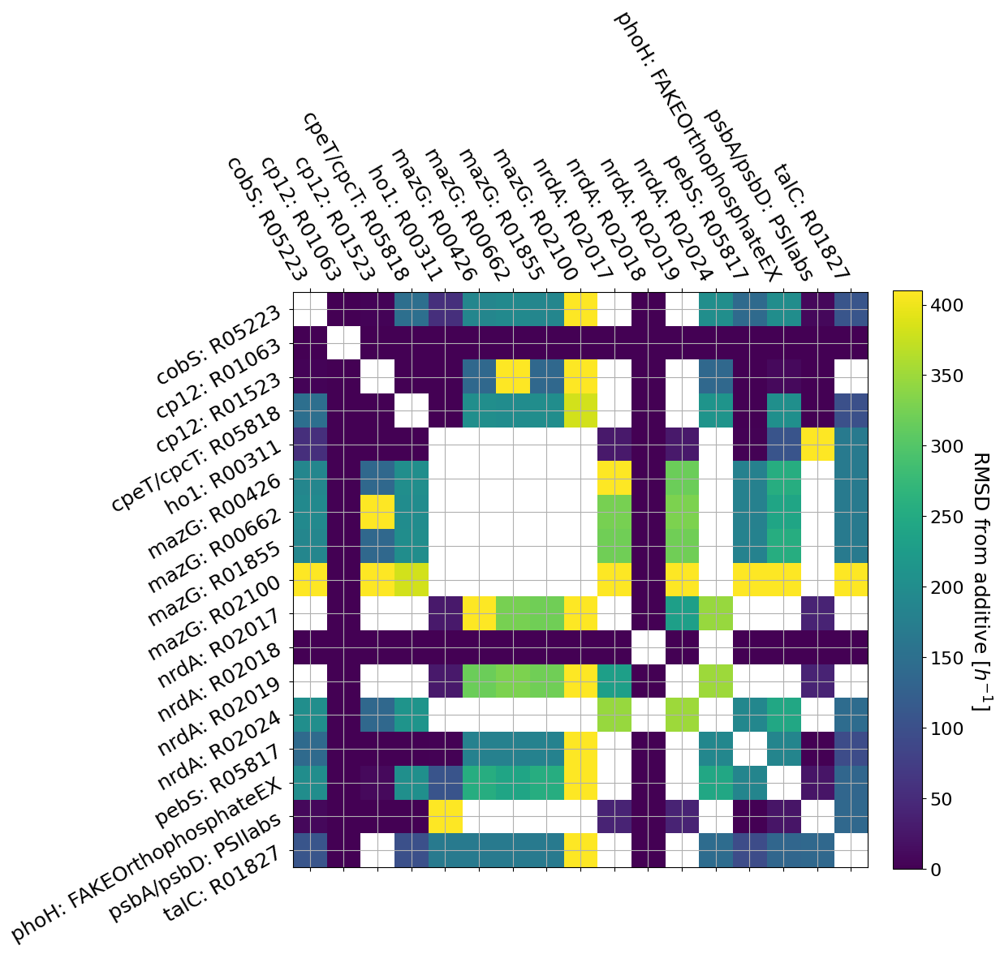

In [8]:
synmat = np.full([len(amgs), len(amgs)], np.nan)

for (i, amg1), (j, amg2) in combinations_with_replacement(
    enumerate(sorted(amgs, key=amg_rxn_names.get)), 2
):
    if (amg1, amg2) in syn:
        synmat[i][j] = syn[(amg1, amg2)]
        synmat[j][i] = syn[(amg1, amg2)]

fig, ax = plt.subplots(figsize=(10, 10))
h = ax.matshow(np.sqrt(synmat), vmin=0, vmax=410)
ax.set_xticks(np.arange(len(amgs)))
ax.set_yticks(np.arange(len(amgs)))
ax.set_xticklabels(
    sorted(amg_rxn_names.values()), rotation=-60, ha="right", fontdict={"fontsize": 18}
)
ax.set_yticklabels(
    sorted(amg_rxn_names.values()), rotation=30, ha="right", fontdict={"fontsize": 18}
)
ax.grid(True)
cb = fig.colorbar(h, ax=ax, fraction=0.046, pad=0.04)
cb.set_label(
    "RMSD from " + r"additive [$h^{-1}$]",
    rotation=-90,
    ha="center",
    fontdict={"fontsize": 18},
    labelpad=25,
)
cb.ax.tick_params(labelsize=16)
plt.show()

## Plot selected examples

Using the array of MFD graphs, the heatmap, and biological intuition as guides, we select two interesting examples to highlight.

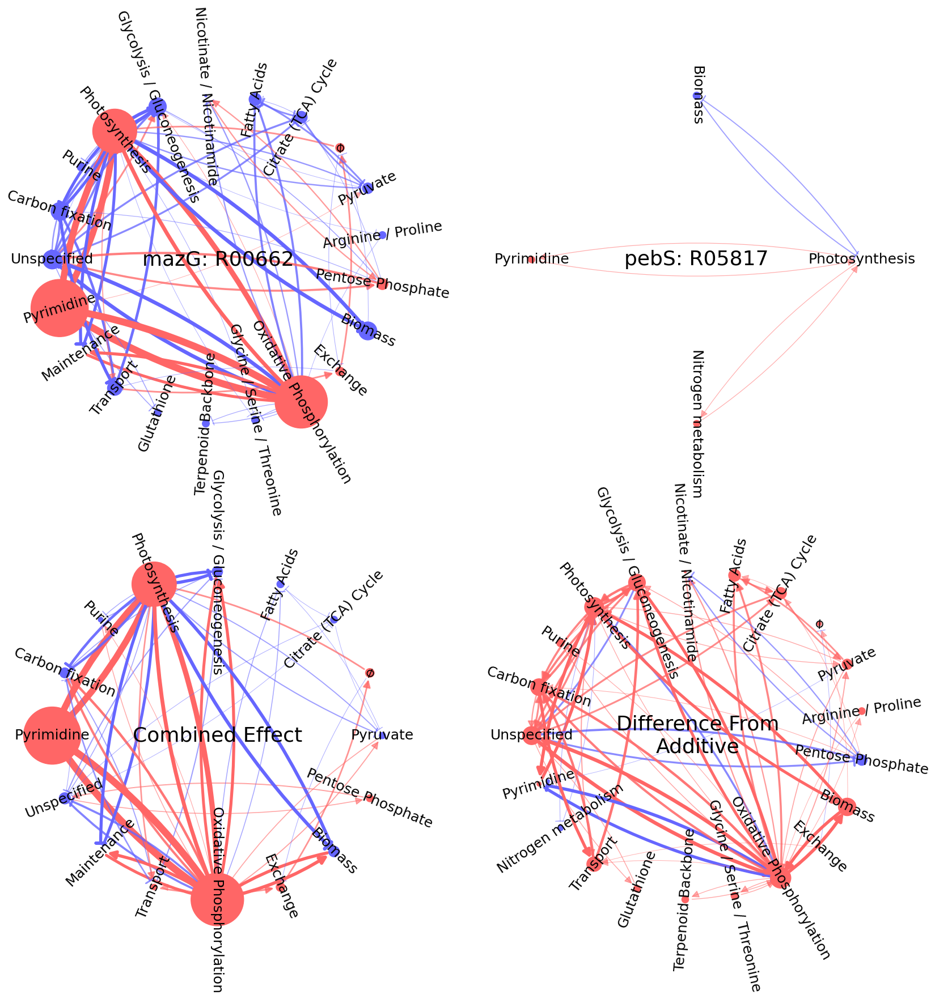

In [9]:
fscale = 10
ncol = 2
nrow = 2
fig, axs = plt.subplots(nrow, ncol, figsize=(ncol * fscale, nrow * fscale))

for ax in axs.flatten():
    ax.xaxis.set_ticks_position("none")
    ax.yaxis.set_ticks_position("none")
    ax.xaxis.set_major_locator(plt.NullLocator())
    ax.yaxis.set_major_locator(plt.NullLocator())
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.spines["left"].set_visible(False)

order = [
    ((0, "R00662"), (0, "R00662"), "single"),
    ((0, "R05817"), (1, "R05817"), "single"),
    ((1, "R00662"), (0, "R05817"), "combo"),
    ((1, "R00662"), (1, "R05817"), "diff"),
]

for (i, amg1), (j, amg2), combo in order:
    ax = axs[i][j]

    ax.xaxis.set_ticks_position("none")
    ax.yaxis.set_ticks_position("none")
    ax.xaxis.set_major_locator(plt.NullLocator())
    ax.yaxis.set_major_locator(plt.NullLocator())

    if (amg1, amg2) in graphs:
        (gp, go, gd) = graphs[(amg1, amg2)]
        scale = 30
        if combo != "diff":
            gd2 = gd
        else:
            g1 = graphs[(amg1, amg1)][-1]
            g2 = graphs[(amg2, amg2)][-1]
            gd2 = gu.diff_graph(gu.diff_graph(gd, g1), g2)
        draw_graph(
            gd2,
            ax,
            cut=25 / scale,
            manual_relabels=manual_relabels,
            scale=scale,
            label_rotation=None,
        )
    else:
        ax.annotate(
            "Infeasible",
            xy=(0.5, 0.5),
            xytext=(0.5, 0.5),
            fontsize=32,
            horizontalalignment="center",
            verticalalignment="center",
        )
    for t in ax.get_children():
        if isinstance(t, plt.Text):
            t.set_fontsize(18)

    tfs = 26
    if combo == "single":
        # ax.set_title(f"{amg1}", fontsize=tfs)
        ax.text(
            0,
            0,
            f"{amg_rxn_names[amg1]}",
            ha="center",
            va="center",
            fontsize=tfs,
        )
    elif combo == "combo":
        # ax.set_title("Combined Effect", fontsize=tfs, pad=50)
        ax.text(
            0,
            0,
            "Combined Effect",
            ha="center",
            va="center",
            fontsize=tfs,
        )
    elif combo == "diff":
        # ax.set_title("Difference From Additive", fontsize=tfs, pad=50)
        ax.text(
            0,
            0,
            "Difference From\nAdditive",
            ha="center",
            va="center",
            fontsize=tfs,
        )
    else:
        raise ValueError(f"Unknown combination type {combo}")

plt.show()

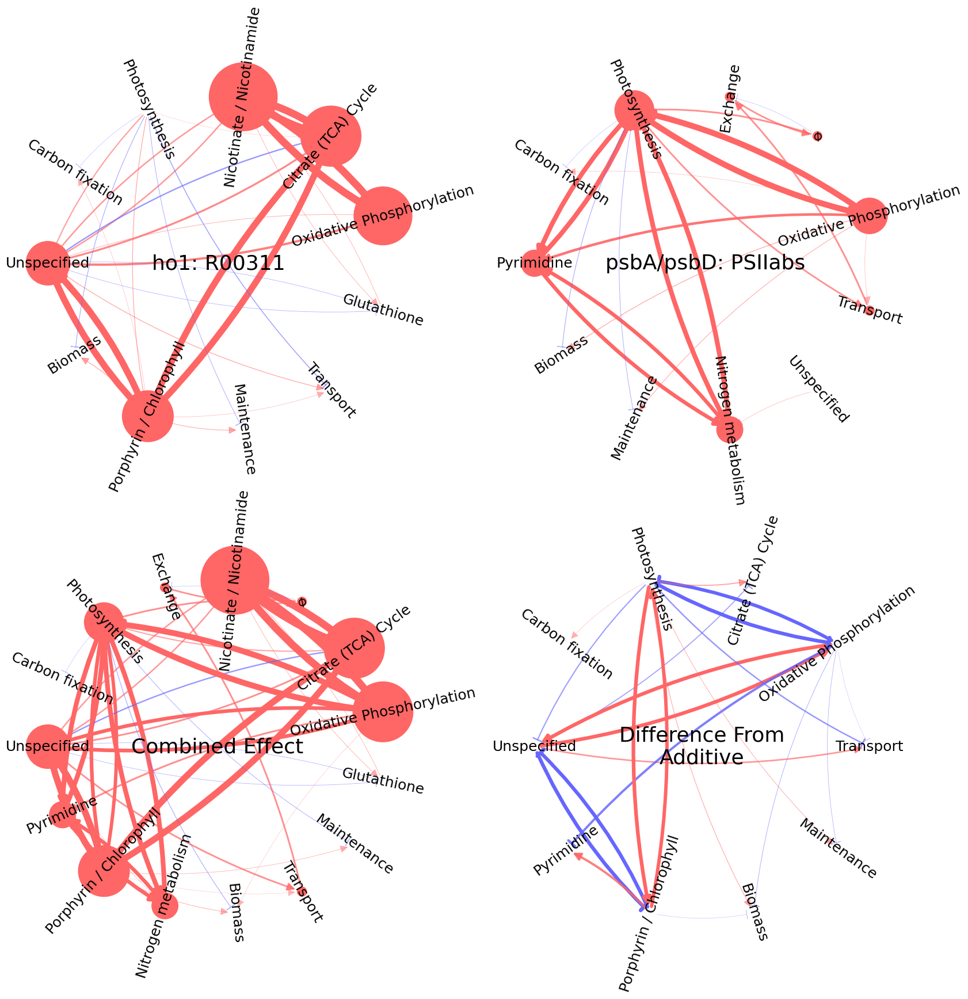

In [10]:
fscale = 10
ncol = 2
nrow = 2
fig, axs = plt.subplots(nrow, ncol, figsize=(ncol * fscale, nrow * fscale))

for ax in axs.flatten():
    ax.xaxis.set_ticks_position("none")
    ax.yaxis.set_ticks_position("none")
    ax.xaxis.set_major_locator(plt.NullLocator())
    ax.yaxis.set_major_locator(plt.NullLocator())
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.spines["left"].set_visible(False)

order = [
    ((0, "R00311"), (0, "R00311"), "single"),
    ((0, "PSIIabs"), (1, "PSIIabs"), "single"),
    ((1, "R00311"), (0, "PSIIabs"), "combo"),
    ((1, "R00311"), (1, "PSIIabs"), "diff"),
]

for (i, amg1), (j, amg2), combo in order:
    ax = axs[i][j]

    ax.xaxis.set_ticks_position("none")
    ax.yaxis.set_ticks_position("none")
    ax.xaxis.set_major_locator(plt.NullLocator())
    ax.yaxis.set_major_locator(plt.NullLocator())

    if (amg1, amg2) in graphs:
        (gp, go, gd) = graphs[(amg1, amg2)]
        scale = 60
        if combo != "diff":
            gd2 = gd
        else:
            g1 = graphs[(amg1, amg1)][-1]
            g2 = graphs[(amg2, amg2)][-1]
            gd2 = gu.diff_graph(gu.diff_graph(gd, g1), g2)
        draw_graph(
            gd2,
            ax,
            cut=25 / scale,
            manual_relabels=manual_relabels,
            scale=scale,
            label_rotation=None,
        )
    else:
        ax.annotate(
            "Infeasible",
            xy=(0.5, 0.5),
            xytext=(0.5, 0.5),
            fontsize=32,
            horizontalalignment="center",
            verticalalignment="center",
        )
    for t in ax.get_children():
        if isinstance(t, plt.Text):
            t.set_fontsize(18)

    tfs = 26
    if combo == "single":
        # ax.set_title(f"{amg1}", fontsize=tfs)
        ax.text(
            0,
            0,
            f"{amg_rxn_names[amg1]}",
            ha="center",
            va="center",
            fontsize=tfs,
        )
    elif combo == "combo":
        # ax.set_title("Combined Effect", fontsize=tfs, pad=50)
        ax.text(
            0,
            0,
            "Combined Effect",
            ha="center",
            va="center",
            fontsize=tfs,
        )
    elif combo == "diff":
        # ax.set_title("Difference From Additive", fontsize=tfs, pad=50)
        ax.text(
            0,
            0,
            "Difference From\nAdditive",
            ha="center",
            va="center",
            fontsize=tfs,
        )
    else:
        raise ValueError(f"Unknown combination type {combo}")

plt.show()